# **DreamBooth: Fine Tuning Text-to-Image Diffusion Models** 🖼️🚀🐱✨🖌️

## Create Ultra-realistic photos of your pet 100% for free under 10 Minutes with just 3-5 images ! 🎨✨

#DreamBooth training with 🧨 Diffusers

Contacts:

- Dali Masmoudi (dmasmoudi@ymail.com)


# DreamBooth


## Introducing DreamBooth

Experience the magic of DreamBooth, a cutting-edge text-to-image diffusion model!

 With just a handful of subject images (typically 3–5), DreamBooth can generate a diverse array of images in various contexts, guided by a simple text prompt. The results are not only visually stunning but also seamlessly blend with their surroundings, showcasing natural interactions and dynamic lighting effects while staying true to the subject's visual essence.

![DreamBooth Teaser](https://dreambooth.github.io/DreamBooth_files/teaser_static.jpg)

## How DreamBooth Works

DreamBooth's innovative approach begins with inputting a small set of subject images (e.g., pictures of a specific dog) along with their corresponding class name (e.g., "dog"). It then refines its algorithms to create a personalized text-to-image model, encoding a unique identifier for the subject. During inference, DreamBooth embeds this identifier into different text prompts to synthesize the subject in diverse contexts, unlocking a world of creative possibilities.

![DreamBooth Method](https://miro.medium.com/v2/resize:fit:1400/1*-8zGs7GBOsJKvg5bIQm5kQ.png)

## 🤗 Hugging Face Integration

Discover DreamBooth's potential with Hugging Face! Their platform hosts a range of state-of-the-art diffusion models, including DreamBooth, within their versatile Diffusers library. Whether you're exploring pre-trained models or embarking on your training journey, Diffusers, built with PyTorch ), provides the tools you need to unleash your creativity.


# Setup

Clone the [🤗 Diffusers](https://github.com/huggingface/diffusers/tree/main) library from source:

In [1]:
!git clone https://github.com/huggingface/diffusers
%cd diffusers
!pip install -e .

Cloning into 'diffusers'...
remote: Enumerating objects: 60977, done.
remote: Counting objects: 100% (980/980), done.
remote: Compressing objects: 100% (560/560), done.
remote: Total 60977 (delta 625), reused 622 (delta 356), pack-reused 59997
Receiving objects: 100% (60977/60977), 42.21 MiB | 25.79 MiB/s, done.
Resolving deltas: 100% (44326/44326), done.
/content/diffusers
Obtaining file:///content/diffusers
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for diffusers (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.28.0.dev0-0.editable-py3-none-any.whl size=11104 sha256=4ef7e829b0782b64124aded521a3c5c675ea6fbb32f769efdd9135ddd8a69761
  Stored in directory: /tmp/pip-ephem-wheel-cache-j8odvxcy/wheels/95/c5/3b/e1b4269f8a2584de57e75f949a185b48fc4144e9a91fc9965a
Successfully built d

In [2]:
%cd examples/dreambooth
!pip install -r requirements.txt

/content/diffusers/examples/dreambooth
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.6/297.6 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.3/168.3 kB 14.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_

When downloading a package from GitHub, the Colab runtime needs a restart in order to correctly import the package (see [this answer](https://stackoverflow.com/a/57839010)). The following code forces the runtime to restart:

In [ ]:
import os
def restart_runtime():
  os.kill(os.getpid(), 9)

restart_runtime()

Initialize an [🤗 Accelerate](https://github.com/huggingface/accelerate) environment:

In [1]:
!accelerate config default

accelerate configuration saved at /root/.cache/huggingface/accelerate/default_config.yaml


[bitsandbytes](https://github.com/TimDettmers/bitsandbytes) provides the 8-bit Adam optimizer that will allow you to train DreamBooth on the 16GB GPU freely available in Colab:

In [2]:
!pip install bitsandbytes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.8/119.8 MB 7.9 MB/s eta 0:00:00


In [3]:
import gc
import torch

from diffusers import StableDiffusionPipeline
from glob import glob
from PIL import Image as Img
from PIL.Image import Image
from typing import List, Union

# Data visualization

Display the images you will train DreamBooth on, in my case, I chose the pictures of my cat 'Spy'

In [4]:
from PIL import Image
import os
from typing import List
from glob import glob
from PIL import Image as Img
def resize_images(input_folder, target_size=(512, 512)):
    resized_images = []
    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png', '.gif')):
            with Image.open(os.path.join(input_folder, filename)) as img:
                img.thumbnail(target_size)
                new_img = Image.new("RGB", target_size, (255, 255, 255))
                paste_position = ((target_size[0] - img.width) // 2, (target_size[1] - img.height) // 2)
                new_img.paste(img, paste_position)
                resized_images.append(new_img)
    return resized_images

def make_img_grid(imgs: List[Image.Image], rows: int) -> Image.Image:
    """
    Creates a grid of `PIL.Image`s.
    """
    cols = len(imgs) // rows
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols*w, rows*h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))

    return grid

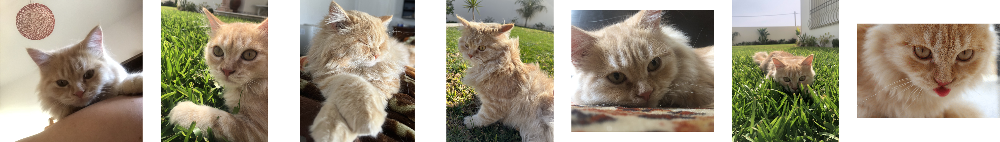

In [6]:
instance_dir = "/content/spy"
imgs = resize_images(instance_dir)
grid_img = make_img_grid(imgs, rows=1)
display(grid_img)

<a name="Training and saving"></a>
# Training and saving

To train DreamBooth, just launch the [`train_dreambooth.py`](https://github.com/huggingface/diffusers/blob/main/examples/dreambooth/train_dreambooth.py) script with the desired command-line arguments. In particular, notice that:
- The `use_8bit_adam` flag allows to run the training script on Colab's 16GB GPU
- The `instance_prompt` contains:
    - Unique identifier: `spychat`
    - Class name: `cat`

  The unique identifier is used to distinguish the particular subject depicted in the images used to fine-tune the model (i.e. Cat) from any other instance of its class that the model has seen during its pre-training (i.e. any other cat). `spychat` is french for spy the kittie.

  ### PS: If you want your model to be saved on your google drive for future uses, run the following cell, otherwise ignore it!

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [30]:
unique_id = "spychat"
class_name = "cat"
instance_prompt = f"a photo of {unique_id} {class_name}"

pretrained_model_name = "CompVis/stable-diffusion-v1-4"
model_out_dir = "/content/drive/MyDrive/ML4CV_handson/ckpts/dreambooth_naive"

In [9]:
!accelerate launch diffusers/examples/dreambooth/train_dreambooth.py \
    --pretrained_model_name_or_path="{pretrained_model_name}" \
    --instance_data_dir="{instance_dir}" \
    --output_dir="{model_out_dir}" \
    --instance_prompt="{instance_prompt}" \
    --resolution=512 \
    --train_batch_size=1 \
    --use_8bit_adam \
    --learning_rate=5e-6 \
    --lr_scheduler="constant" \
    --lr_warmup_steps=0 \
    --max_train_steps=400

2024-04-28 18:43:19.585718: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-28 18:43:19.585766: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-28 18:43:19.586990: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-28 18:43:20.710972: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
04/28/2024 18:43:22 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: no

tokenizer/tokenizer_config.json: 100% 806/806 [00:00<00:00, 4.59MB/s]
tokeni

# Inference with multiple images

A 🤗 Diffusers *pipeline* is a quick and easy way to run a model for inference, requiring just a few lines of code to generate an image. All pipelines are built from the base [`DiffusionPipeline`](https://huggingface.co/docs/diffusers/main/en/api/pipelines/overview#diffusers.DiffusionPipeline) class, which provides basic functionalities for loading, downloading, and saving all the components required to run inference. Specific pipeline types (e.g. [`StableDiffusionPipeline`](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/text2img#diffusers.StableDiffusionPipeline)), loaded with the [`from_pretrained`](https://huggingface.co/docs/diffusers/main/en/api/pipelines/overview#diffusers.DiffusionPipeline.from_pretrained) method, are automatically detected and allow the pipeline components to be loaded and passed to the pipeline constructor.

In [31]:
#from PIL import Image as Img

from PIL import Image

def gen_imgs(
    prompts: Union[str, List[str]],
    pipeline: StableDiffusionPipeline,
    num_inference_steps: int = 50,
    num_images_per_prompt: int = 1,
    rows: int = 1
) -> List[str]:
    """
    Generates `num_images_per_prompt` images for each prompt in `prompts`
    by running DreamBooth inference and saves them in a folder named "generated_images".
    """
    # Create the output folder if it doesn't exist
    output_folder = "generated_images"
    os.makedirs(output_folder, exist_ok=True)

    imgs_paths = []

    for prompt_idx, prompt in enumerate(prompts):
        generated_imgs = pipeline(
            [prompt],
            num_inference_steps=num_inference_steps,
            num_images_per_prompt=num_images_per_prompt
        ).images

        for img_idx, img in enumerate(generated_imgs):
            img_path = os.path.join(output_folder, f"prompt_{prompt_idx}_img_{img_idx}.png")
            img.save(img_path)
            imgs_paths.append(img_path)

    return imgs_paths

In [32]:
pipeline = StableDiffusionPipeline.from_pretrained(
    model_out_dir,
    torch_dtype=torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [33]:

prompts = [
    f"a {unique_id} {class_name} in the snow",
    f"a {unique_id} {class_name} with santa",
    f"a {unique_id} {class_name} in New York",
    f"a {unique_id} {class_name} on the lap of a person",
    f"a {unique_id} {class_name} swimming",

    f"a {unique_id} {class_name} with a city in the background",
    f"a {unique_id} {class_name} with a mountain in the background",
    f"a {unique_id} {class_name} with a blue house in the background",
    f"a {unique_id} {class_name} wearing a santa hat",
    f"a {unique_id} {class_name} wearing a rainbow scarf",

    f"a {unique_id} {class_name} wearing glasses",
    f"a {unique_id} {class_name} wearing a black top hat and a monocle",

    f"a {unique_id} {class_name} in a firefighter outfit",
    f"a {unique_id} {class_name} in jumping in the air"
]

imgs = gen_imgs(prompts, pipeline, rows=3)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

# Display the generated images ! 🤗

The generated images will be saved in a created folder called `generated_images` and will be displayed be running the following cell.


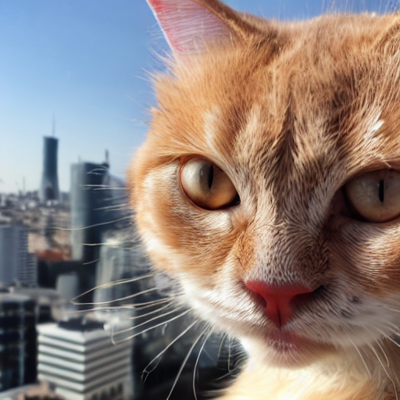
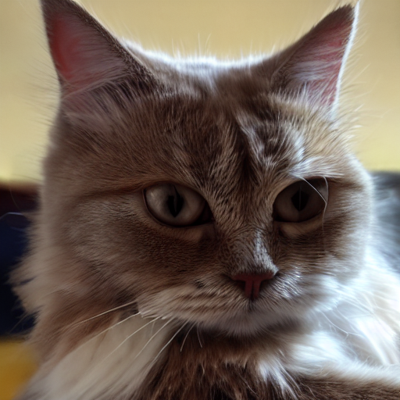
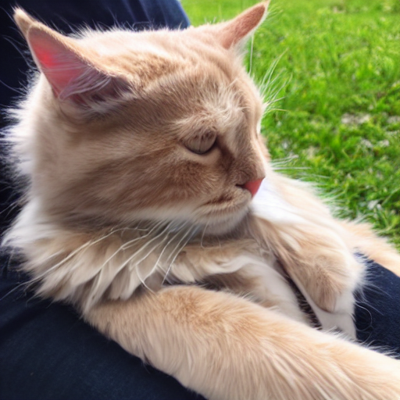
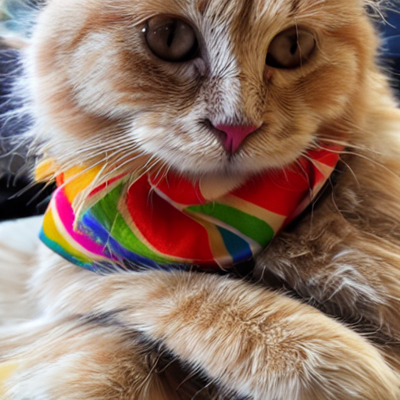
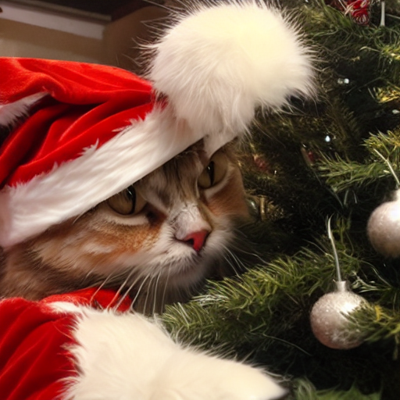
...
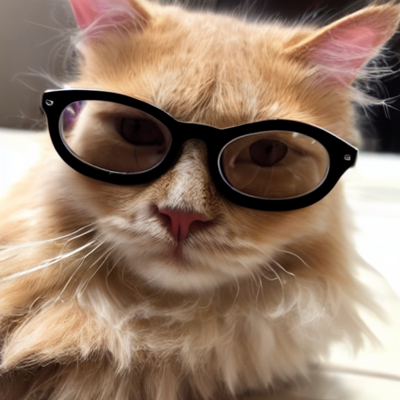
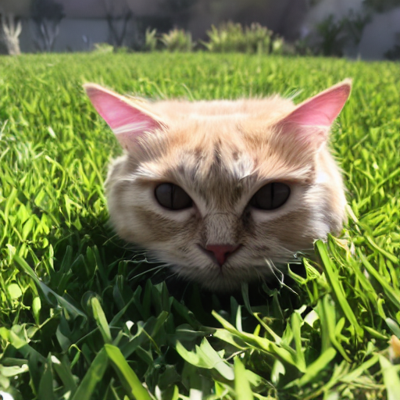
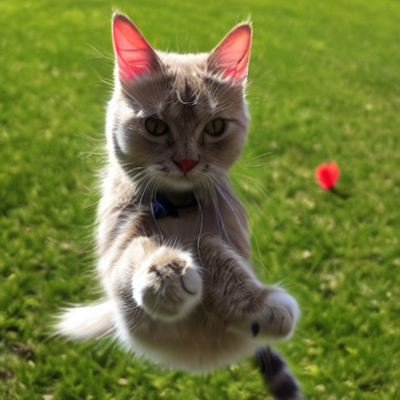
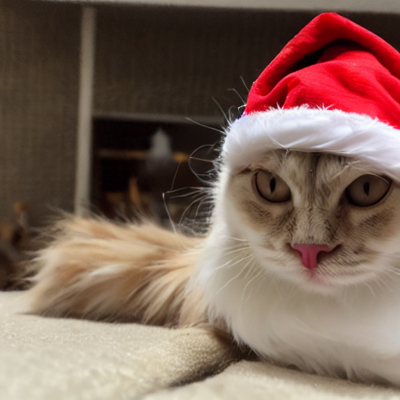
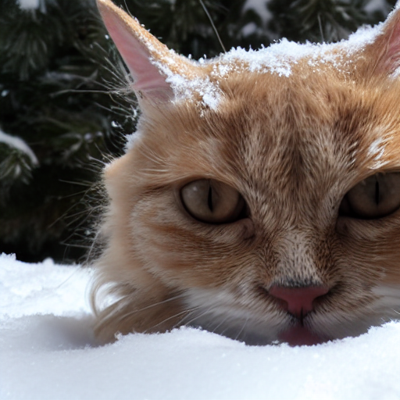

In [34]:
from IPython.display import display, HTML
def display_images_in_folder(folder_path: str, rows: int = 1, image_width: int = 300):
    """
    Displays all images in the specified folder in a grid.
    """
    # Get a list of all image files in the folder
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    image_files = [f for f in image_files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    # Load images and display them in a grid
    images = [Image.open(os.path.join(folder_path, img)) for img in image_files]

    html = "<div style='display: flex; flex-wrap: wrap;'>"
    for img in images:
        img.thumbnail((image_width, image_width))
        html += f"<div style='margin: 5px;'><img src='data:image/png;base64,{image_to_base64(img)}'></div>"
    html += "</div>"

    display(HTML(html))

def image_to_base64(image: Image.Image) -> str:
    """
    Converts a PIL Image to base64 encoded string.
    """
    from io import BytesIO
    import base64

    buffered = BytesIO()
    image.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode("utf-8")

# Usage example:
display_images_in_folder("generated_images", rows=2, image_width=400)

[These](https://github.com/google/dreambooth/blob/main/dataset/prompts_and_classes.txt) are the kind of prompts used by the DreamBooth authors in the paper. If you are curious to experiment with more complex prompts, you can check out [this website](https://lexica.art) for inspiration.

# Inference with single image

Run the pipeline on a single image and increase a number of inference steps `num_inference_steps` for better results.

In [35]:
def gen_and_display_single_img(
    prompt: Union[str, List[str]],
    pipeline: StableDiffusionPipeline,
    num_inference_steps: int = 200,
    output_folder: str = "generated_images"
) -> Image:
    """
    Generates a single image for the given prompt using DreamBooth inference
    and displays it.
    """
    img = pipeline(
        prompt,
        num_inference_steps=num_inference_steps,
        num_images_per_prompt=1
    ).images[0]  # Take the first (and only) image

    display(img)  # Display the generated image
    img_path = os.path.join(output_folder, f"single_image.png")
    img.save(img_path)

    return img

  0%|          | 0/200 [00:00<?, ?it/s]

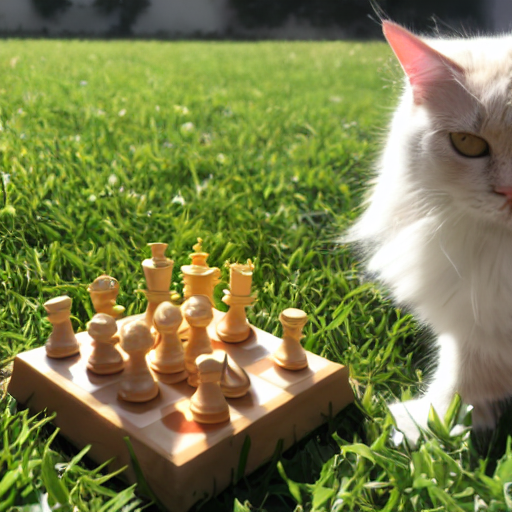

In [36]:
prompt = [
    f"a {unique_id} {class_name} playing chess",

]

imgs = gen_and_display_single_img(prompt, pipeline)

# Schedulers

Depending on the context, a scheduler defines how to iteratively add noise to an image or how to update a sample based on a model’s output:

- During training, a scheduler defines how to add noise to a sample to train a diffusion model.
- During inference, a scheduler defines how to update a sample based on a trained model’s output.

Schedulers can be quite complex and often define a trade-off between denoising *speed* and denoising *quality*. It is extremely difficult to measure quantitatively which scheduler works best for a given diffusion pipeline, so it is often recommended to simply compare them qualitatively.

The scheduler you have been using so far can be accessed via the `scheduler` attribute of the pipeline:

In [23]:
pipeline.scheduler

PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.28.0.dev0",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "timestep_spacing": "leading",
  "trained_betas": null
}

You can see that the scheduler is of type [`PNDMScheduler`](https://huggingface.co/docs/diffusers/v0.24.0/en/api/schedulers/pndm#diffusers.PNDMScheduler). You can take a look at all available, compatible schedulers for `StableDiffusionPipeline` by accessing the `compatibles` attribute of the current scheduler:

In [24]:
pipeline.scheduler.compatibles

[diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.utils.dummy_torch_and_torchsde_objects.DPMSolverSDEScheduler,
 diffusers.schedulers.scheduling_lms_discrete.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_discrete.KDPM2DiscreteScheduler,
 diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.schedulers.scheduling_deis_multistep.DEISMultistepScheduler,
 diffusers.schedulers.scheduling_unipc_multistep.UniPCMultistepScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_ancestral_discrete.KDPM2AncestralDiscret

## Compare different schedulers

To compare the results given by different schedulers at inference time and by setting a random seed, you should perform the following steps:


  0%|          | 0/50 [00:00<?, ?it/s]

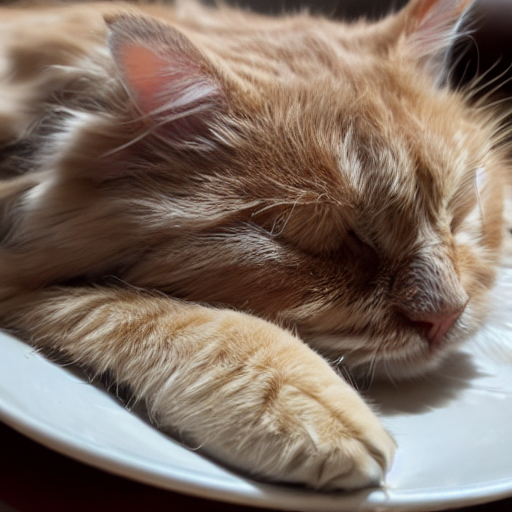

In [25]:
prompt = f"a {unique_id} {class_name} sleeping on a plate"
seed = 2
generator = torch.Generator(device="cuda").manual_seed(seed)
image = pipeline(prompt, generator=generator).images[0]

output_folder = "generated_images"
img_path = os.path.join(output_folder, f"single_image_1.png")
image.save(img_path)
image

# Now with [`DDIMScheduler`](https://huggingface.co/docs/diffusers/v0.24.0/enapi/schedulers/ddim#diffusers.DDIMScheduler).
 To change the scheduler of the pipeline you can use the `config` attribute of `pipeline.scheduler` in combination with the [`from_config`](https://huggingface.co/docs/diffusers/api/configuration#diffusers.ConfigMixin.from_config) method of `DDIMScheduler`.

  0%|          | 0/50 [00:00<?, ?it/s]

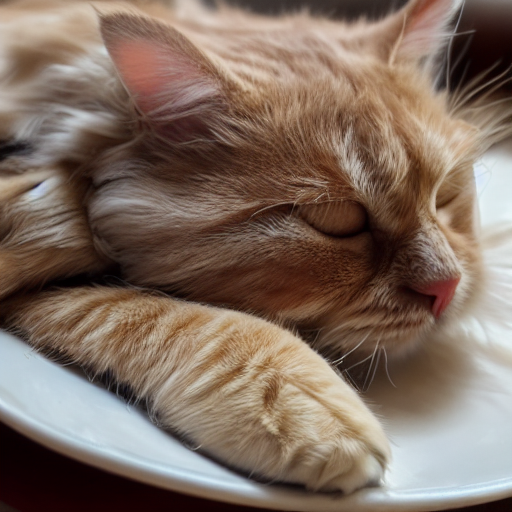

In [26]:
from diffusers import DDIMScheduler
generator = torch.Generator(device="cuda").manual_seed(seed)
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
image = pipeline(prompt, generator=generator).images[0]
output_folder = "generated_images"
img_path = os.path.join(output_folder, f"single_image_2.png")
image.save(img_path)
image

# Now with [`LMSDiscreteScheduler`](https://huggingface.co/docs/diffusers/v0.24.0/en/api/schedulers/lms_discrete#diffusers.LMSDiscreteScheduler).
 If you are interested in generating an output that, despite the fixed seed, looks sensibly different from the previous ones, try out [`EulerAncestralDiscreteScheduler`](https://huggingface.co/docs/diffusers/v0.24.0/en/api/schedulers/euler_ancestral#diffusers.EulerAncestralDiscreteScheduler): *ancestral* sampling techniques are designed to foster exploration and diversity in the generated outputs by allowing the model to venture into uncharted regions of the probability distribution.

  0%|          | 0/50 [00:00<?, ?it/s]

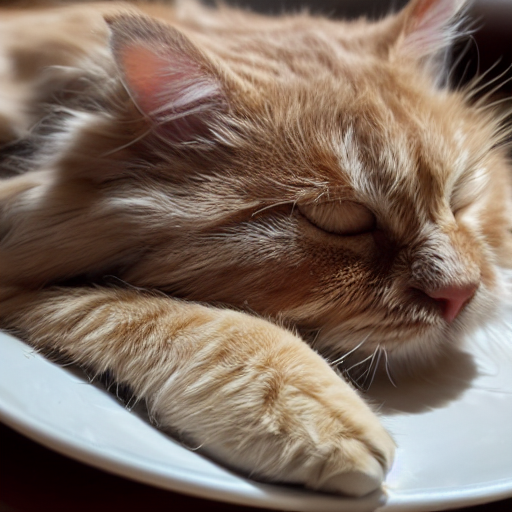

In [27]:
from diffusers import LMSDiscreteScheduler
generator = torch.Generator(device="cuda").manual_seed(seed)
pipeline.scheduler = LMSDiscreteScheduler.from_config(pipeline.scheduler.config)
image = pipeline(prompt, generator=generator).images[0]
output_folder = "generated_images"
img_path = os.path.join(output_folder, f"single_image_3.png")
image.save(img_path)
image


  0%|          | 0/50 [00:00<?, ?it/s]

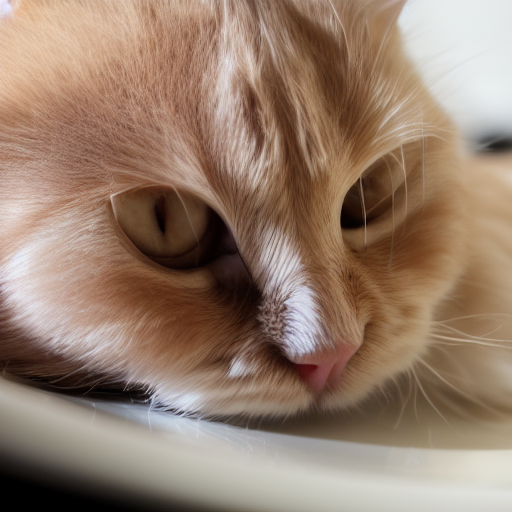

In [28]:
from diffusers import EulerAncestralDiscreteScheduler

generator = torch.Generator(device="cuda").manual_seed(seed)
pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(pipeline.scheduler.config)
image = pipeline(prompt, generator=generator).images[0]
output_folder = "generated_images"
img_path = os.path.join(output_folder, f"single_image_4.png")
image.save(img_path)
image

# Prior Preservation Loss (PPL)

From the Dreambooth [paper](https://arxiv.org/pdf/2208.12242.pdf):

> In our experience, the best results for maximum subject fidelity are achieved by fine-tuning all layers of the model. This includes fine-tuning layers that are conditioned on the text embeddings, which gives rise to the problem of *language drift*. Language drift has been an observed problem in language models, where a model that is pre-trained on a large text corpus and later fine-tuned for a specific task progressively loses syntactic and semantic knowledge of the language. To the best of our knowledge, we are the first to find a similar phenomenon affecting diffusion models, where the model slowly forgets how to generate subjects of the same class as the target subject.
>
> Another problem is the possibility of *reduced output diversity*. Text-to-image diffusion models naturally posses high amounts of output diversity. When fine-tuning on a small set of images we would like to be able to generate the subject in novel viewpoints, poses and articulations. Yet, there is a risk of reducing the amount of variability in the output poses and views of the subject (e.g. snapping to the few-shot views). We observe that this is often the case, especially when the model is trained for too long.
>
> To mitigate the two aforementioned issues, we propose an autogenous class-specific prior preservation loss that encourages diversity and counters language drift. In essence, our method is to supervise the model with its *own generated samples*, in order for it to retain the prior once the few-shot fine-tuning begins. This allows it to generate diverse images of the class prior, as well as retain knowledge about the class prior that it can use in conjunction with knowledge about the subject instance.

<img src="https://miro.medium.com/v2/resize:fit:1200/1*rTBj17pxwwMxdt4bEOZesw.png" width="650">

You trained your current model with what the authors call *naive* fine-tuning, i.e. without PPL. Does it suffer from language drift then? In other words, did it loose the ability to generate generic cats?

In [29]:
prompt = f"a {class_name}"
imgs = gen_imgs(prompt, pipeline, num_images_per_prompt=5)
imgs

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

['generated_images/prompt_0_img_0.png',
 'generated_images/prompt_0_img_1.png',
 'generated_images/prompt_0_img_2.png',
 'generated_images/prompt_0_img_3.png',
 'generated_images/prompt_0_img_4.png',
 'generated_images/prompt_1_img_0.png',
 'generated_images/prompt_1_img_1.png',
 'generated_images/prompt_1_img_2.png',
 'generated_images/prompt_1_img_3.png',
 'generated_images/prompt_1_img_4.png',
 'generated_images/prompt_2_img_0.png',
 'generated_images/prompt_2_img_1.png',
 'generated_images/prompt_2_img_2.png',
 'generated_images/prompt_2_img_3.png',
 'generated_images/prompt_2_img_4.png',
 'generated_images/prompt_3_img_0.png',
 'generated_images/prompt_3_img_1.png',
 'generated_images/prompt_3_img_2.png',
 'generated_images/prompt_3_img_3.png',
 'generated_images/prompt_3_img_4.png',
 'generated_images/prompt_4_img_0.png',
 'generated_images/prompt_4_img_1.png',
 'generated_images/prompt_4_img_2.png',
 'generated_images/prompt_4_img_3.png',
 'generated_images/prompt_4_img_4.png']

Also, how much pose variability and appearence diversity (compared to the images used for fine-tuning) does the model exhibit when asked to generate images of the target subject?

In [37]:
prompt = f"a {unique_id} {class_name}"
imgs = gen_imgs(prompt, pipeline, num_images_per_prompt=2)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

## Train DreamBooth with PPL

### Data visualization

[Discussions](https://www.reddit.com/r/DreamBooth/comments/zyc5gh/do_class_images_have_to_be_generated/) on the internet suggest that class images of real subjects actually work better than generated ones, so that's what you will use to train DreamBooth with PPL. This will also allow you to fine-tune the model faster (compared to traditional PPL), as no inference steps will be needed at the beginning of training to generate class images.

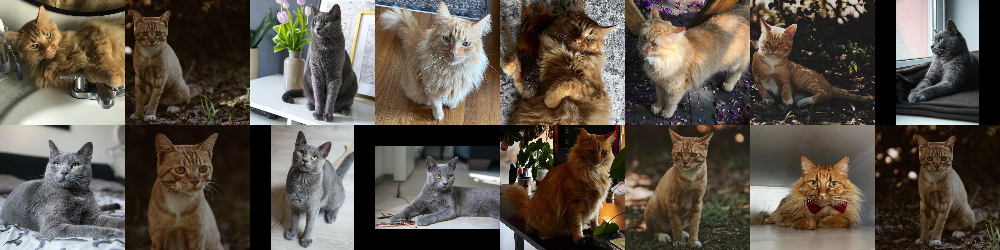

In [38]:
class_dir = "/content/cats"
imgs = [Img.open(fname) for fname in glob(f"{class_dir}/*.jpg")]
num_class_imgs = len(imgs)

make_img_grid(imgs, rows=2)

These images come from [here](https://github.com/google/dreambooth/tree/main/dataset/cat), [here](https://github.com/google/dreambooth/tree/main/dataset/cat2), and [here](https://jefsnacker.medium.com/dreambooth-hyperparameter-guide-d8b7cd264245).

### Training

In [39]:
class_prompt = f"a photo of {class_name}"
model_out_dir = "/content/drive/MyDrive/ML4CV_handson/ckpts/dreambooth_preservation"

Free up your GPU RAM, as you will need almost all of it for training:

In [40]:
torch.cuda.empty_cache()
gc.collect()

54

Launch the [`train_dreambooth.py`](https://github.com/huggingface/diffusers/blob/main/examples/dreambooth/train_dreambooth.py) script as you did in the previous [Training](#training) section. In order to use PPL, you will need to **add** the following command-line arguments:
- The directory containing the class images (i.e. the cats)
- A flag specifying that you want to use PPL
- The class prompt
- The number of class images

Also, you will need to change the value passed to the argument storing the output directory for the model weights.

If you get a `CUDA out of memory` error, add a flag to activate *gradient checkpointing*, which will save some memory at the expense of a slower backward pass.

In [44]:

!accelerate launch diffusers/examples/dreambooth/train_dreambooth.py \
    --pretrained_model_name_or_path="{pretrained_model_name}" \
    --instance_data_dir="{instance_dir}" \
    --class_data_dir="{class_dir}" \
    --output_dir="{model_out_dir}" \
    --with_prior_preservation \
    --instance_prompt="{instance_prompt}" \
    --class_prompt="{class_prompt}" \
    --resolution=512 \
    --train_batch_size=1 \
    --use_8bit_adam \
    --learning_rate=5e-6 \
    --lr_scheduler="constant" \
    --lr_warmup_steps=0 \
    --num_class_images="{num_class_imgs}" \
    --gradient_checkpointing\
    --max_train_steps=400


2024-04-28 19:41:17.921608: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-28 19:41:17.921657: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-28 19:41:17.927795: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-28 19:41:20.018238: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
04/28/2024 19:41:22 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: no

You are using a model of type clip_text_model to instantiate a model of type

### Inference

In [45]:
pipeline = StableDiffusionPipeline.from_pretrained(
    model_out_dir,
    torch_dtype=torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Does the model still exhibit language drift?

In [46]:
prompt = f"a {class_name}"
imgs = gen_imgs(prompt, pipeline, num_images_per_prompt=5)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Have you achieved more output diversity?

In [47]:
prompt = f"a {unique_id} {class_name}"
imgs = gen_imgs(prompt, pipeline, num_images_per_prompt=5)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [48]:
imgs = gen_imgs(prompts, pipeline, rows=3)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [49]:
pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(pipeline.scheduler.config)
imgs = gen_imgs(prompts, pipeline, rows=3)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]